## Analysis of the class: airplane

In [1]:
#from cnn-error-analysis
from cnn-error-analysis import cifar10
from cnn-error-analysis import data_analysis as da
from cnn-error-analysis import visualization as vis
from cnn-error-analysis import evaluation as ev

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


### set paths

In [2]:
# set paths to stored extracted features
fv_test_url = "D:/tmp/inceptionV1_finetuned_cifar10_version9/ckpt_204365_extracted/InceptionV1_CifarTest_fv.csv"
logits_test_url = "D:/tmp/inceptionV1_finetuned_cifar10_version9/ckpt_204365_extracted/InceptionV1_CifarTest_logits.csv"

fv_train_url = "D:/tmp/inceptionV1_finetuned_cifar10_version9/ckpt_204365_extracted/InceptionV1_CifarTrain_fv.csv"
logits_train_url = "D:/tmp/inceptionV1_finetuned_cifar10_version9/ckpt_204365_extracted/InceptionV1_CifarTrain_logits.csv"

In [3]:
current_analysis_folder = "F:/diplomarbeit_bjoern_moeller/analysis/train_and_test_data/automobile/"
current_class = "automobile"

### load the data, build dataframes, choose the class

In [4]:
# load the data: Test Set
cifar_test_fv_df = cifar10.load_csv_into_df(fv_test_url)
cifar_test_logits_df = cifar10.load_csv_into_df(logits_test_url)
#Train Set
cifar_train_fv_df = cifar10.load_csv_into_df(fv_train_url)
cifar_train_logits_df = cifar10.load_csv_into_df(logits_train_url)

#concat
fv_df = pd.concat([cifar_test_fv_df, cifar_train_fv_df])
logits_df = pd.concat([cifar_test_logits_df, cifar_train_logits_df])
# predict and label column in logits df
logits_df = cifar10.add_predicted_classnr_column(logits_df)
clogits_df = cifar10.add_true_classnr_column(logits_df)
logits_df.head(n=3)

#reset index
fv_df = fv_df.reset_index(drop=True)
logits_df = logits_df.reset_index(drop=True)

#slice
x_fv_df = cifar10.slice_df_by_classes(fv_df,[current_class])
x_logits_df = cifar10.slice_df_by_classes(logits_df,[current_class])                           

df shape (6000, 1025)
df shape (6000, 13)


In [5]:
x_fv_df.head()

,image,n0,n1,n2,n3,n4,n5,n6,n7,n8,...,n1014,n1015,n1016,n1017,n1018,n1019,n1020,n1021,n1022,n1023
6,automobile6,0.380289,0.136479,0.036788,0.000648,0.510041,1.074989,0.031788,1.156651,0.007993,...,0.119954,0.098887,0.229055,0.989102,1.025369,0.000000,1.094920,1.048403,0.148315,0.608427
9,automobile9,0.080292,0.051323,0.043413,0.164760,0.128607,0.924907,0.017312,0.934317,0.303299,...,0.000000,0.630009,0.089495,0.676665,0.614341,0.254738,0.544157,0.664161,0.113011,0.684635
37,automobile37,0.444162,0.037107,0.274054,0.010062,0.586052,0.711727,0.020537,0.526414,0.006902,...,0.096420,0.000000,0.730523,0.096142,1.103782,0.017353,1.002436,0.345968,0.289449,0.480575
66,automobile66,0.138659,0.049681,0.152640,0.192234,0.125837,0.577111,0.244229,0.497482,0.274367,...,0.020335,0.143418,0.014866,1.202513,0.574153,0.157586,0.396530,0.675613,0.000000,0.324255
81,automobile81,0.228556,0.097352,0.000000,0.003361,0.403434,0.626992,0.002377,0.808527,0.000000,...,0.006076,0.001253,0.094844,0.382233,0.802613,0.007384,0.465765,0.703757,0.049657,0.186732


In [6]:
x_logits_df.head()

,image,out0,out1,out2,out3,out4,out5,out6,out7,out8,out9,prediction,true_label
6,automobile6,-3.409172,15.053436,0.178348,1.523964,-3.778380,-2.585313,-3.861915,-0.945792,-3.961712,0.260534,1,1
9,automobile9,-5.144416,9.333012,-0.845279,-3.636702,-1.441278,-3.297617,2.701800,-1.780116,0.099177,4.037289,1,1
37,automobile37,0.046800,3.726711,-3.091647,-2.374674,-2.453754,-2.456558,-1.546906,-0.880614,-2.176810,12.261252,9,1
66,automobile66,-2.845156,13.191251,-2.914324,-3.222996,-1.933687,-1.461457,-1.393480,-4.078303,5.324421,-2.292196,1,1
81,automobile81,-1.449823,11.345952,-3.668451,-2.135625,-3.406456,-0.471249,1.619549,-1.092996,-2.181910,0.952199,1,1


# Feature Analysis

### PCA
Principal Component Analysis -> 50 Dimensions or 95% EV

In [7]:
#fv_pca_df, fig_pca = da.pca(x_fv_df,50)
#fig_pca.savefig(current_analysis_folder + current_class +'_PCA.png')

Explained Variance:
[0.16102    0.08675895 0.07637543 0.07439244 0.05431585 0.04893869
 0.04708485 0.03735968 0.03659099 0.03278401 0.02876796 0.01765463
 0.01459515 0.01343671 0.01066742 0.00883542 0.00823521 0.00782116
 0.00735879 0.0068256  0.00595974 0.00563097 0.00515532 0.00488708
 0.00462935 0.00446881 0.00419247 0.00404148 0.00395451 0.00383023
 0.00375969 0.00368614 0.00349914 0.00339778 0.00332224 0.00320926
 0.00306316 0.00295991 0.00286163 0.0026097  0.00254322 0.00249965
 0.00244134 0.00236328 0.00232442 0.00215503 0.00209615 0.00207252
 0.0019678  0.00190054 0.00185075 0.00181328 0.00176722 0.00174494
 0.00172284 0.00169653 0.00162428 0.0015665  0.00146993 0.00146681
 0.00143295 0.00138052 0.00133431 0.00130595 0.00125014 0.00123853
 0.00120515 0.00118852 0.00117051 0.00113527 0.0010947  0.00107215
 0.00105639 0.00102819 0.00099217 0.00097662 0.00094966 0.00094608
 0.00092277 0.00087478 0.00086061 0.00084151 0.00082397 0.00080709
 0.00079362 0.00078404 0.000759   0.000751

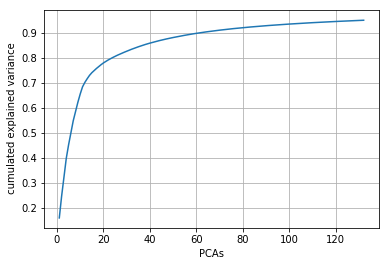

In [8]:
fv_pca_df, fig_pca = da.pca_with_target_variance(x_fv_df,0.95)
fig_pca.savefig(current_analysis_folder + current_class +'_PCA_095.png')

### t-SNE
t-distributed Neigbourhood Embedding -> 2 Dimensions


In [9]:
#fv_tsne_df = da.tsne(fv_pca_df,2)

In [10]:
#save 2d dimensional tsne data 
#fv_tsne_df.to_csv(path_or_buf=current_analysis_folder+ current_class +"_2d_tsne.csv",index=False)

In [11]:
#load the stored tsne variables
fv_tsne_df = pd.read_csv(current_analysis_folder+current_class+"_2d_tsne.csv", sep=',', low_memory=False, error_bad_lines=False,header=None,skiprows=[0])

## visualize tsne reduced data

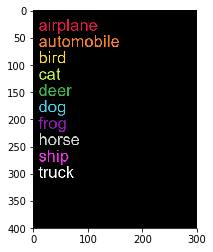

In [12]:
#Create a visualizer object
visualizer = vis.Visualizer(cifar10.class_names)
plt.imshow(visualizer.get_color_legend())

In [13]:
#Load Images
cifarDataManager = cifar10.CifarDataManager()
test_images = cifarDataManager.test.images
train_images = cifarDataManager.train.images
images = np.concatenate((test_images, train_images), axis=0)
print(str(images.shape))

x_images = images[x_fv_df.index.tolist(),:,:,:]

D:/tmp/cifar10_pythonversion/cifar-10-batches-py/data_batch_1
D:/tmp/cifar10_pythonversion/cifar-10-batches-py/data_batch_2
D:/tmp/cifar10_pythonversion/cifar-10-batches-py/data_batch_3
D:/tmp/cifar10_pythonversion/cifar-10-batches-py/data_batch_4
D:/tmp/cifar10_pythonversion/cifar-10-batches-py/data_batch_5
D:/tmp/cifar10_pythonversion/cifar-10-batches-py/test_batch
(60000, 32, 32, 3)


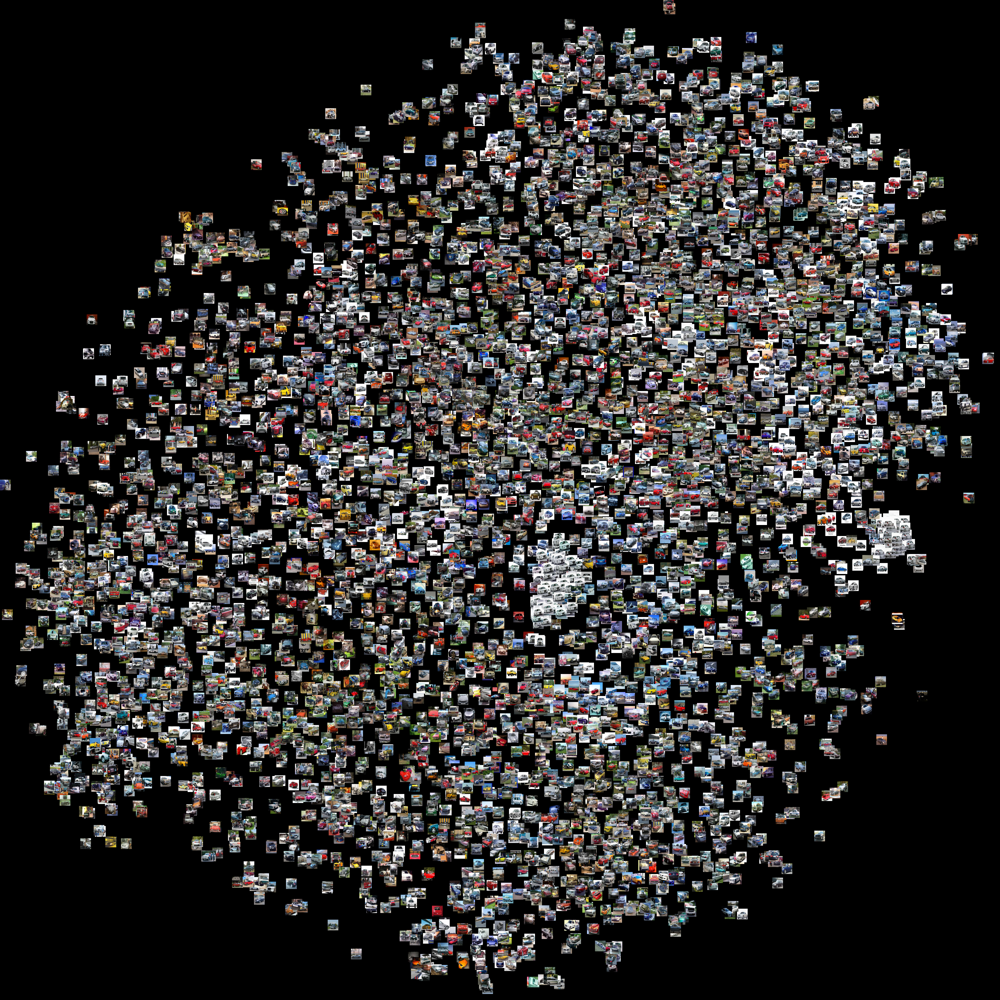

In [14]:
structure_images = visualizer.plot_images_2d(fv_tsne_df,x_logits_df,x_images,width=3000,height=3000)
structure_images.save(current_analysis_folder + current_class + '_images_noborder.png')
structure_images


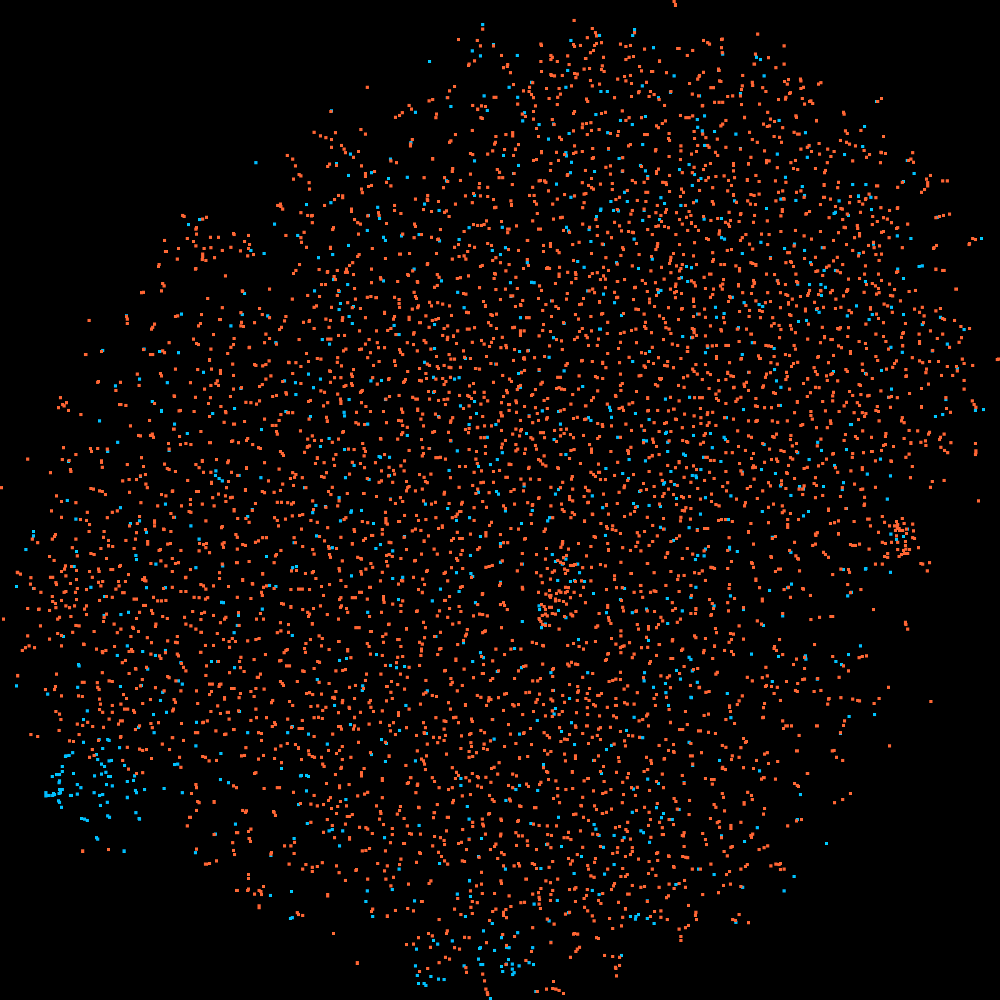

In [15]:
dots_split = visualizer.plot_pixel_2d(fv_tsne_df,x_logits_df, mode="datasplit",width=1600,height=1600,dotsize=5)
dots_split.save(current_analysis_folder + current_class + '_data_split.png')
dots_split

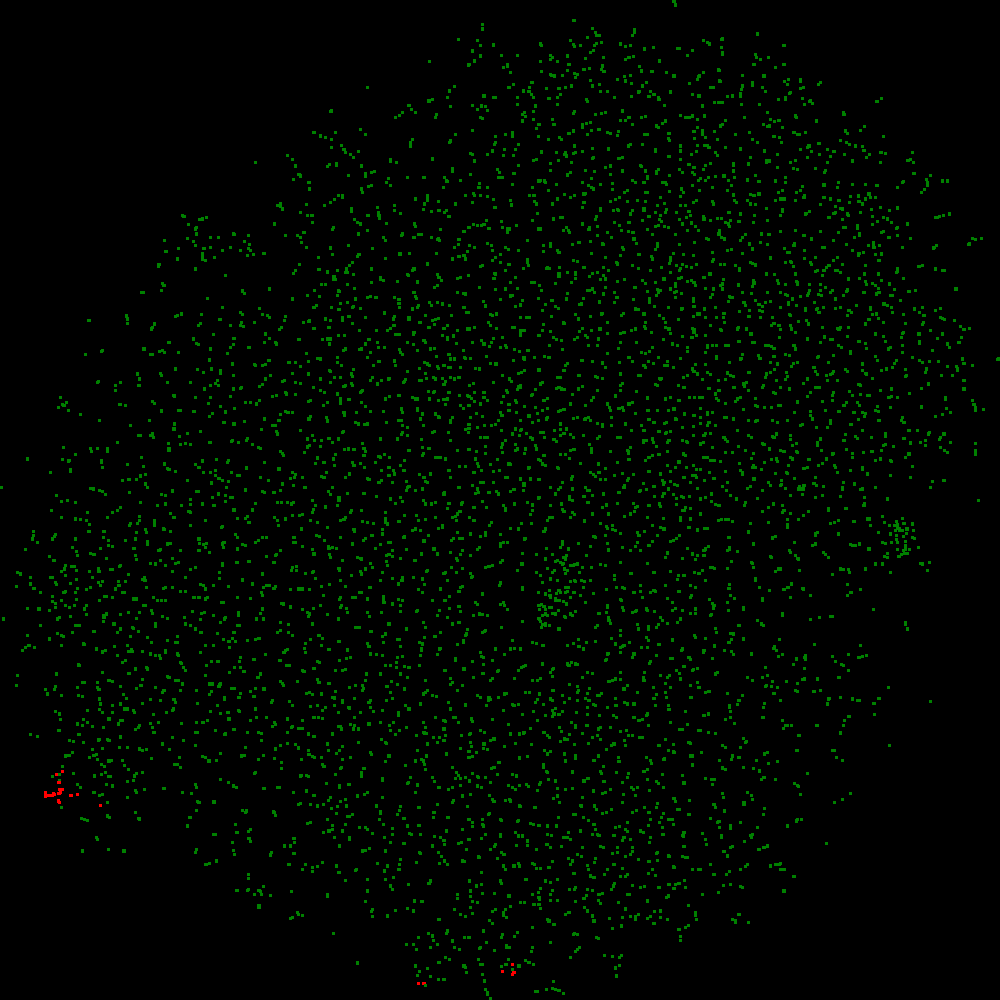

In [16]:
dots_error = visualizer.plot_pixel_2d(fv_tsne_df,x_logits_df, mode="error",width=1600,height=1600,dotsize=5)
dots_error.save(current_analysis_folder + current_class + '_error.png')
dots_error

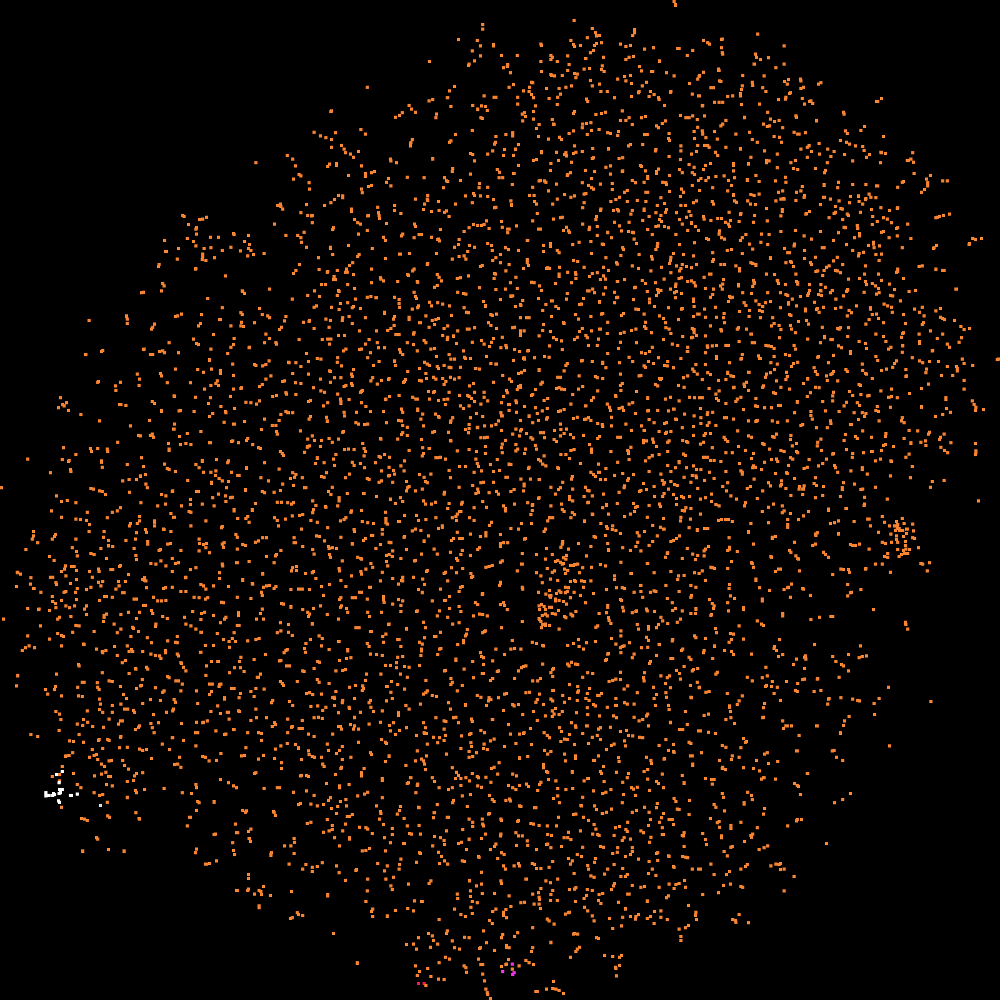

In [17]:
dots_prediction = visualizer.plot_pixel_2d(fv_tsne_df,x_logits_df, mode="prediction",width=1600,height=1600,dotsize=5)
dots_prediction.save(current_analysis_folder + current_class + '_prediction.png')
dots_prediction

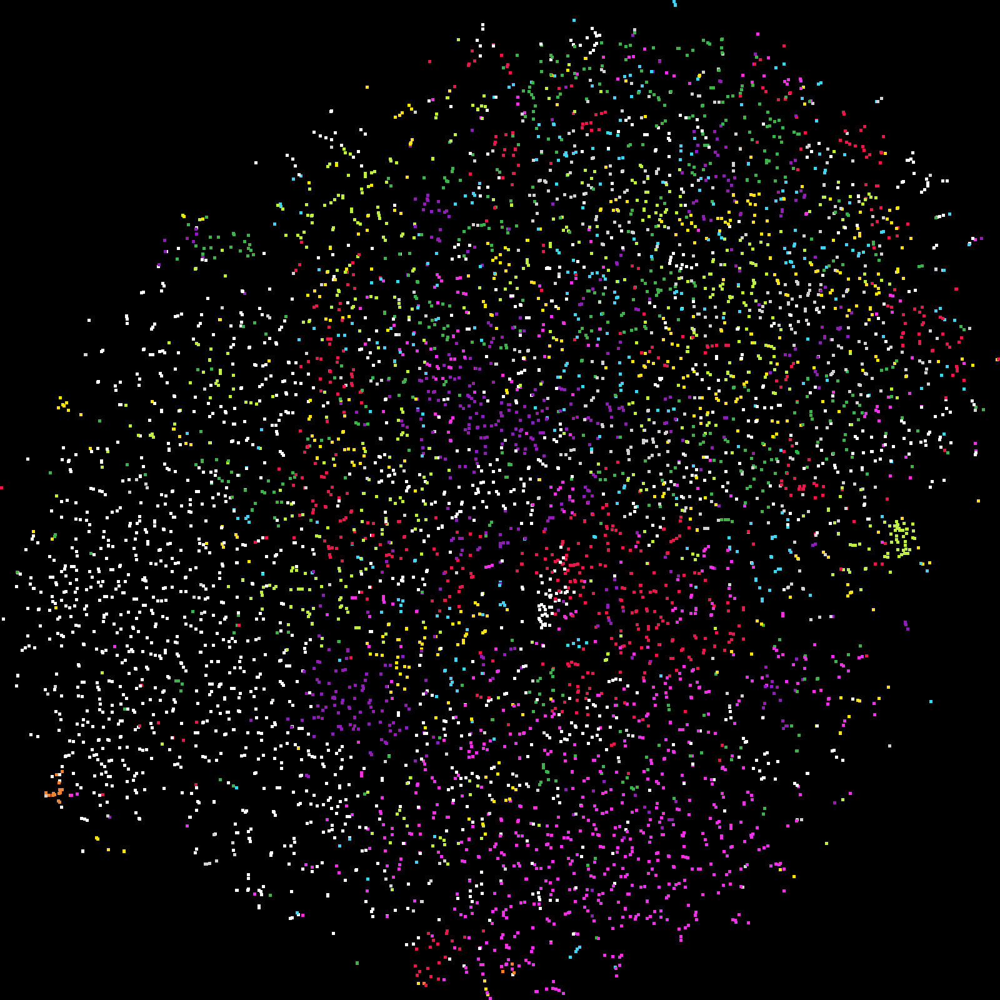

In [18]:
dots_out2 = visualizer.plot_pixel_2d(fv_tsne_df,x_logits_df, mode="output",class_nr=1,width=1600,height=1600,dotsize=5)
dots_out2.save(current_analysis_folder + current_class + '_2nd_highest_output.png')
dots_out2

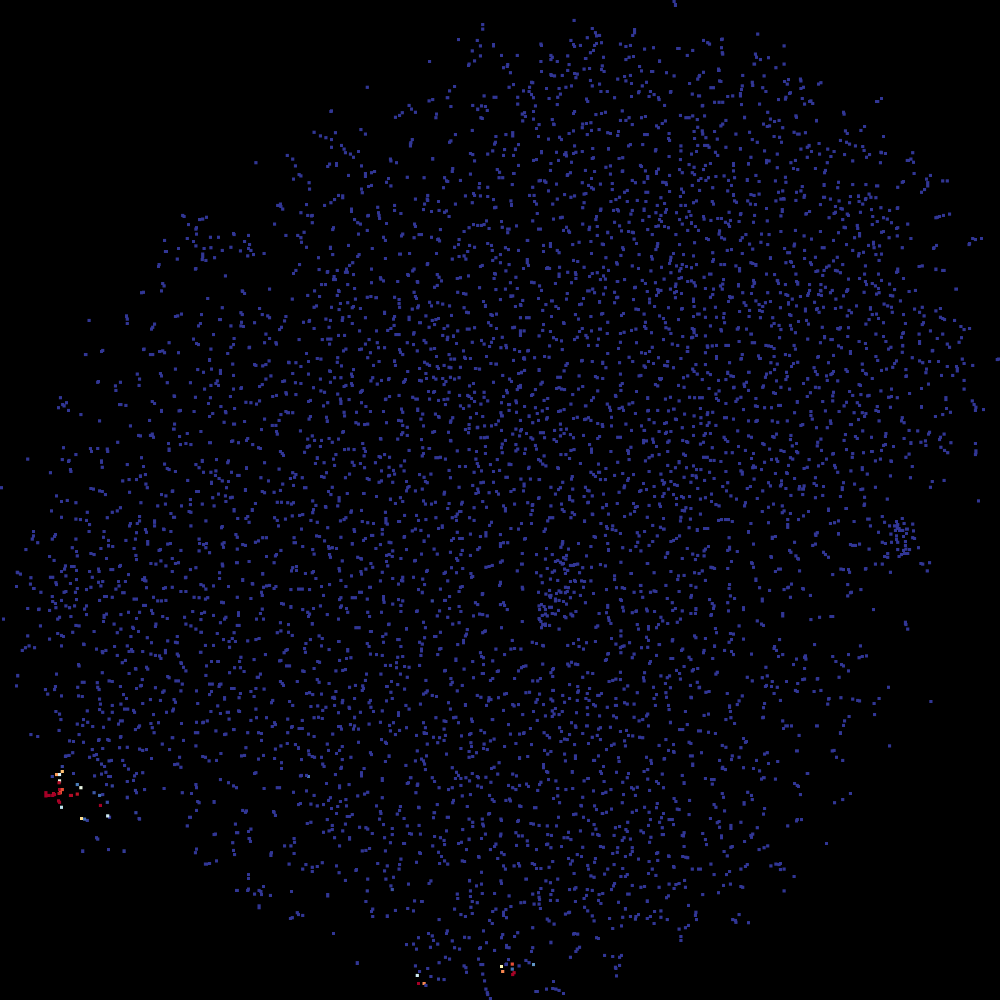

In [19]:
dots_conf = visualizer.plot_pixel_2d(fv_tsne_df,x_logits_df, mode="confidence",class_nr=1,width=1600,height=1600,dotsize=5)
dots_conf.save(current_analysis_folder + current_class + '_confidence.png')
dots_conf

## Clustering
k-means for 50-dim data (pca reduced)

kmeans done 49 times . time elapsed: 160.92989921569824 seconds


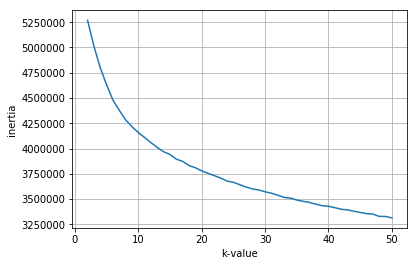

In [20]:
k_values_plot, partitions = da.kmeans_eval(fv_pca_df, 50)
k_values_plot.savefig(current_analysis_folder + current_class +'_K-Means.png')

choose k=10 -> partitions[8]

In [21]:
#choose a partition and analyse the clusters
#labels = partitions[8].predict(np.array(fv_pca_df))

In [22]:
#assign labels for datapoints in quantile
labels_manually = vis.assign_cluster_manually(partitions[8].transform(fv_pca_df),0.7)

6000
10


In [23]:
visualizer.plot_images_per_cluster(fv_tsne_df ,labels_manually,x_logits_df, images, current_analysis_folder)